In [390]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import statsmodels.api as sm
import missingno as msno
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression, ElasticNet, ElasticNetCV, Lasso, Ridge, RidgeCV, LassoCV, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, make_scorer
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

plt.style.use('bmh')
pd.set_option('display.max_columns', None)
%matplotlib inline

## Data Exploration

In [2]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [3]:
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [4]:
train_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [5]:
train_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
train_df.shape

(1460, 81)

From the above, we can see that the training dataset contains 1460 rows with 81 columns. Also, just from the top 10 rows alone, we can see that there are a number of columns with missing values.

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
percent_missing = train_df.isnull().sum() * 100 / len(train_df)
missing_value_df = pd.DataFrame({'column_name': train_df.columns,
                                 'percent_missing': percent_missing})

missing_value_df.sort_values('percent_missing', ascending = False, inplace = True)

In [9]:
missing_value_df.head(15)

,column_name,percent_missing
PoolQC,PoolQC,99.520548
MiscFeature,MiscFeature,96.301370
Alley,Alley,93.767123
Fence,Fence,80.753425
FireplaceQu,FireplaceQu,47.260274
LotFrontage,LotFrontage,17.739726
GarageYrBlt,GarageYrBlt,5.547945
GarageCond,GarageCond,5.547945
GarageType,GarageType,5.547945
GarageFinish,GarageFinish,5.547945


There are a number of columns with a significant number of missing values, for example `Alley`, `PoolQC` and `MiscFeature`. As there is already a large number of features to analyze, we can consider removing columns with 60% or more `NaN` values that are less relevant to our analysis.

In [10]:
perc = 60.0
min_count =  int(((100-perc)/100)*train_df.shape[0] + 1) # Minimum Count of train_df matching 60% threshold
new_df = train_df.dropna(axis = 1, thresh = min_count) # Drop rows that do not meet threshold for NaN values
del new_df['Id']

In [11]:
print('Training Dataset: Dropped Columns:\n----------------')
for col in train_df.columns.difference(new_df.columns):
    print(col)

Training Dataset: Dropped Columns:
----------------
Alley
Fence
Id
MiscFeature
PoolQC


We have dropped 5 features, including `Id` which is not necessary for our analysis.

In [12]:
train_df = new_df.copy()

We have went from 81 columns to 76 columns, which is a minor improvement but should serve to make our analysis less cumbersome. A feature to be wary of in later analysis would be FireplaceQu, of which 47.3% of data in the column contains `NaN`.

We can do the same thing to our testing dataset as well.

In [13]:
perc = 60.0
min_count =  int(((100-perc)/100)*test_df.shape[0] + 1) # Minimum Count of train_df matching 60% threshold
new_df = test_df.dropna(axis = 1, thresh = min_count) # Drop rows that do not meet threshold for NaN values
del new_df['Id']

In [14]:
print('Testing Dataset: Dropped Columns:\n----------------')
for col in test_df.columns.difference(new_df.columns):
    print(col)

Testing Dataset: Dropped Columns:
----------------
Alley
Fence
Id
MiscFeature
PoolQC


In [15]:
test_df = new_df.copy()

#### Let's start off with analysing Sales Price, the target variable that we are trying to predict.

In [16]:
train_df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [17]:
fig = px.histogram(train_df, x = 'SalePrice', marginal = 'box', title = 'Histogram and Box Plot of Sale Prices')
fig.show()

The most common sale prices lie between 140k - 150k. Also, there is a noticeable positive skew, with the presence of many outliers.

In [18]:
print('Skewness: %f' % train_df['SalePrice'].skew())
print('Kurtosis: %f' % train_df['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


In [19]:
train_df.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


### Predictor Variable Analysis

Here, we can split our analysis into numerical and categorical predictor variables so as to make things easier.

In [20]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

There are 37 columns containing numeric data, of which 3 are `float64` and 34 are `int64`.

In [21]:
num_df = train_df.select_dtypes(include = ['int64', 'float64']) # Select columns containing data with float64 or int64 encoding

In [22]:
num_df.shape

(1460, 37)

In [23]:
num_df.head(10)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


Now, we can plot a histogram for each numerical variable.

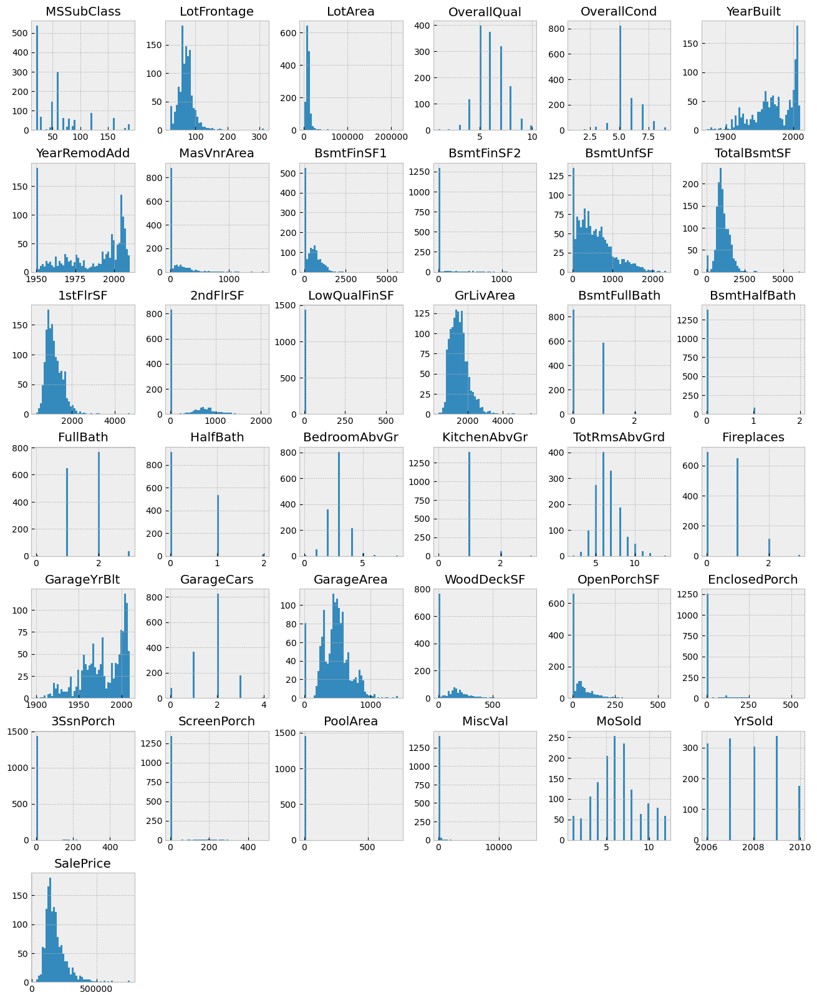

In [24]:
num_df.hist(figsize = (16,20), bins = 50);

At first glance, there are several variables that are actually categorical in nature, for example `OverallQual` and `OverallCond` (ratings) which are ordinal. Also, there are variables that are extremely positively skewed with significant peakedness, such as `ScreenPorch` and `3SsnPorch`. Lastly, we have variables such as `GrLivArea` and `TotalBsmtSF` that have a distribution similar to that of our target variable, `SalePrice`, which may hint at their relevance in predicting `SalePrice`.

Now, we can consider the correlation between each numerical variable with our target variable, `SalePrice`.

In [25]:
corrs = num_df.drop('SalePrice', axis = 1).corrwith(num_df['SalePrice']).sort_values(ascending = False)

In [26]:
print(corrs)

OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
dtype: float64


Focusing on the rightmost column, we can see a number of variables that have a moderate or strong correlation to `SalePrice`. Let's extract a list of the top 10 variables.

In [27]:
corrs.head(10)

OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
dtype: float64

`OverallQual` has the highest correlation with `SalePrice`, followed by `GrLivArea`, `GarageCars`, `GarageArea` and `TotalBsmtSF`. If we go back to the histograms plotted earlier, we can see that `GrLivArea` and `TotalBsmtSF` indeed have a distribution similar to that of `SalePrice`, which supports our initial intuition.

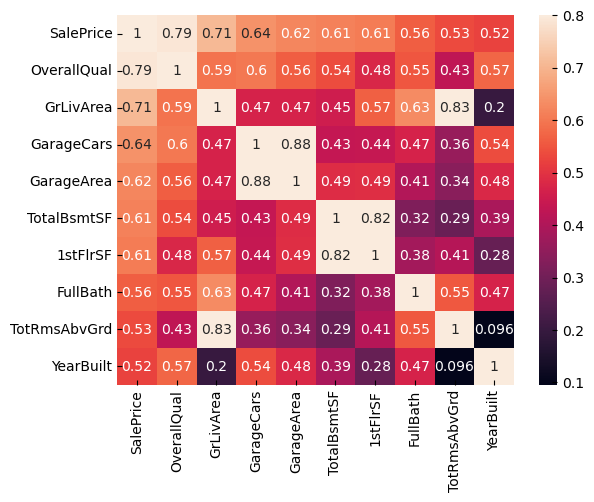

In [28]:
corrmat = train_df.corr()
top10_cols = corrmat.nlargest(10, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(num_df[top10_cols].values.T)
sns.heatmap(cm, annot = True, cbar = True, yticklabels = top10_cols.values, xticklabels = top10_cols.values, vmax = 0.8);

Here, we can see that some of the predictor variables are highly correlated to each other as well. 
- `GarageArea` & `GarageCars` have a correlation of `0.88`, which makes sense as the Size of garage in square feet and Size of garage in square feet describe the same thing, just in different units.
- `TotRmsAbvGrd` and `GrLivArea` have a correlation of `0.83`, which makes sense as houses with higher living area square feet typically have more rooms as well.
- `TotalBsmtSF` and `1stFlrSF` have a correlation of `0.82`, which is expected as houses typically have similar square feets for both the basement and 1st floor.
- `YearBuilt` has a correlation of `0.52` with `SalePrice`, which might possibly indicate that houses that are built more recently may perhaps have a higher sale price, due to having a more modern design for example.
- As expected, houses with larger areas (sq. ft) tend to have a higher sale price on average.

Although the issue of multicollinearity arises, regression models such as Ridge and Lasso regression are able to deal with it by removing them from the model.


In [29]:
best_features = corrs.head(9)

In [30]:
best_features = [col for col in best_features.index]

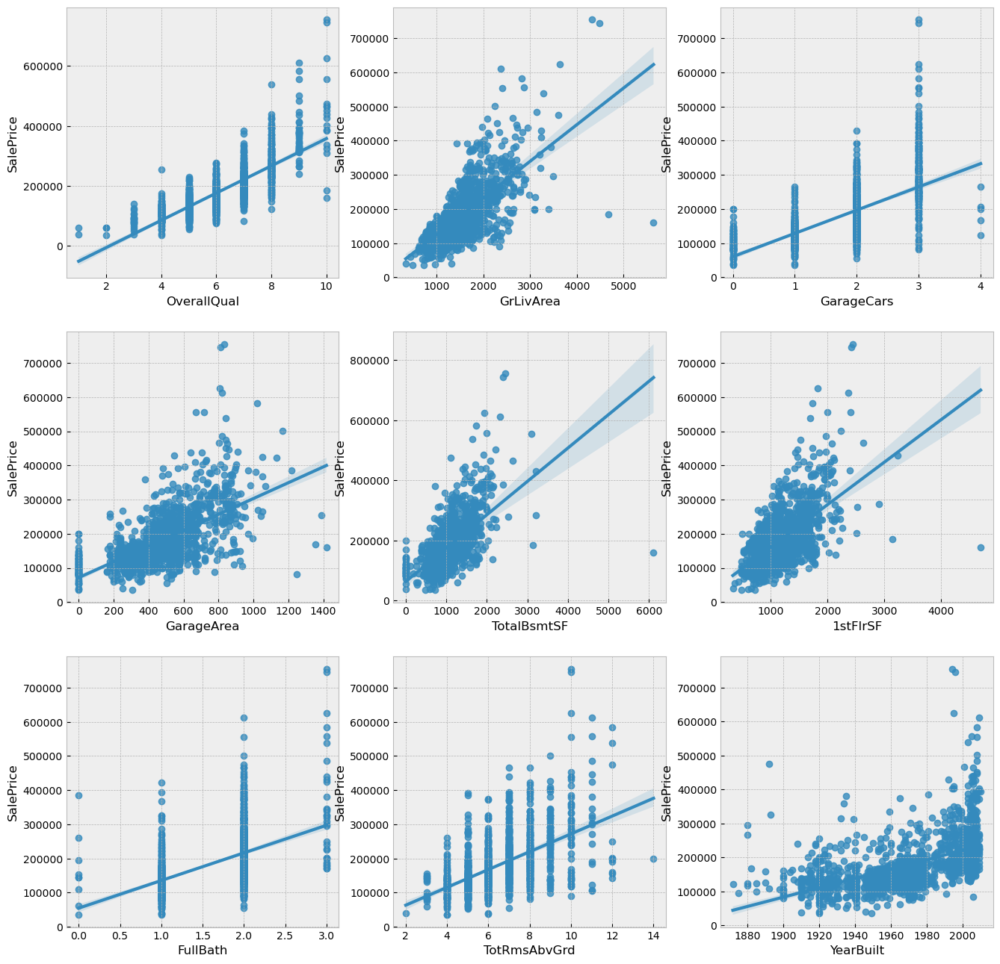

In [31]:
fig, ax = plt.subplots(3, 3, figsize = (16, 16))
for i, ax in enumerate(fig.axes):
    if i < len(best_features):
        sns.regplot(x = best_features[i], y = 'SalePrice', data = train_df, ax = ax)

From the scatter plots, we can see the presence of outliers, especially in `GrLivArea`, `TotalBsmtSF` and `1stFlrSF`. From prior analysis, we know that these variables are highly correlated, which might imply that they might actually be the same data points. Here, we can consider removing the 2 egregious outliers in `GrLivArea` with really high `GrLivArea` values but extremely low `SalePrice`.

In [57]:
train_df[(train_df['GrLivArea'] > 4000) & (train_df['SalePrice'] < 200000)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
523,60,RL,130.0,40094,Pave,IR1,Bnk,AllPub,Inside,Gtl,Edwards,PosN,PosN,1Fam,2Story,10,5,2007,2008,Hip,CompShg,CemntBd,CmentBd,Stone,762.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2260,Unf,0,878,3138,GasA,Ex,Y,SBrkr,3138,1538,0,4676,1,0,3,1,3,1,Ex,11,Typ,1,Gd,BuiltIn,2007.0,Fin,3,884,TA,TA,Y,208,406,0,0,0,0,0,10,2007,New,Partial,184750
1298,60,RL,313.0,63887,Pave,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,0,1,2008,New,Partial,160000


In [58]:
train_df = train_df.drop(train_df[(train_df['GrLivArea'] > 4000) & (train_df['SalePrice'] < 200000)].index)

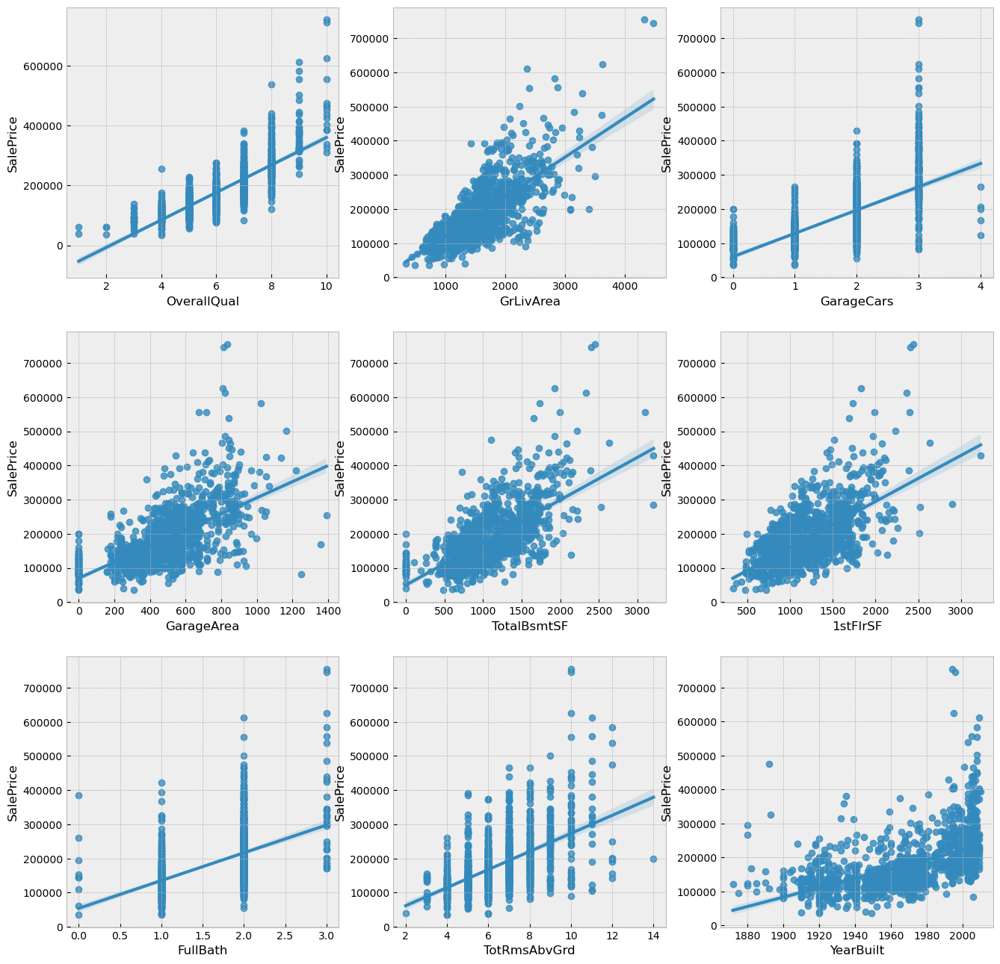

In [59]:
fig, ax = plt.subplots(3, 3, figsize = (16, 16))
for i, ax in enumerate(fig.axes):
    if i < len(best_features):
        sns.regplot(x = best_features[i], y = 'SalePrice', data = train_df, ax = ax)

Now, we can see that some egregious outliers have disappeared from `TotalBsmtSF` and `1stFlrSF` as well.

In [32]:
best_features.append('SalePrice')

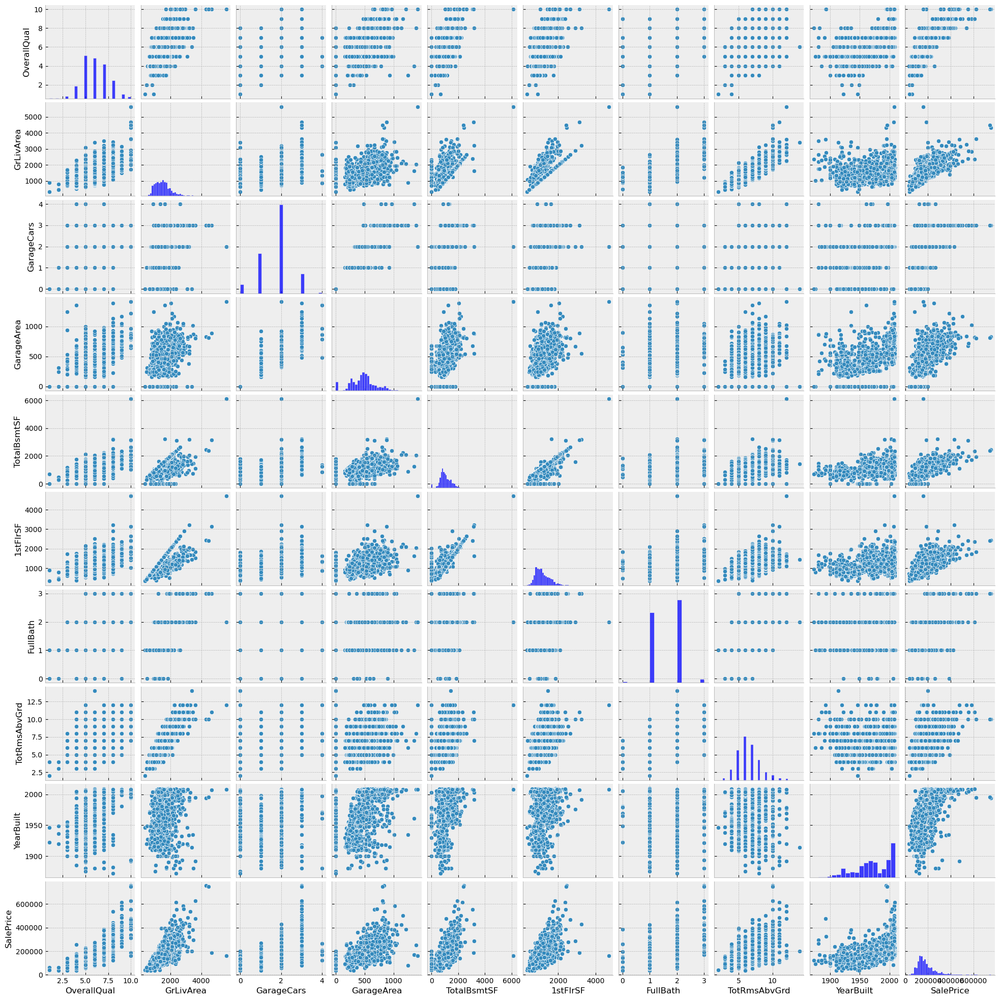

In [33]:
sns.pairplot(train_df[best_features], height = 2);

As expected, from the scatter plots, we can see a linear relationship between each of the predictor variables and `SalePrice`. The spread of each point seems to widen at higher levels of `SalePrice`, which might hint at heteroskedasticity.

#### Now, let us look at the relationship between categorical predictors and `SalePrice`.

In [34]:
category_df = train_df.select_dtypes(include = ['object']) # Select columns containing data with float64 or int64 encoding

In [35]:
category_df.head(10)

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
5,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,WD,Normal
6,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
7,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
8,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,WD,Abnorml
9,RL,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,WD,Normal


In [36]:
category_df.columns

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

Given the large number of predictor variables, we could focus on a few which might have more relevance. With reference to the description given for the dataset, variables such as `MSZoning`, `Utilities`, `LotConfig`, `Condition1`, `Condition2`, `BldgType` and `HouseStyle` may perhaps be more relevant. Now, let us look at some of these variables.

In [37]:
fig = px.box(train_df, y = 'SalePrice', x = 'MSZoning', points = 'all', notched = True, 
             color = 'MSZoning', title = 'Box Plot of MSZoning')
fig.show()

In [38]:
fig = px.box(train_df, y = 'SalePrice', x = 'Utilities', points = 'all', notched = True, 
             color = 'Utilities', title = 'Box Plot of Utilities')
fig.show()

It seems like almost all houses in the dataset fall under the `AllPub` category, which refers to '*All Public Utilties*'. It may be possible to remove such variables as almost all data points fall under 1 or 2 categories. We can look deeper into this later.

In [39]:
fig = px.box(train_df, y = 'SalePrice', x = 'LotConfig', points = 'all', notched = True, 
             color = 'LotConfig', title = 'Box Plot of LotConfig')
fig.show()

In [40]:
fig = px.box(train_df, y = 'SalePrice', x = 'BldgType', points = 'all', notched = True, 
             color = 'BldgType', title = 'Box Plot of BldgType')
fig.show()

In [41]:
fig = px.box(train_df, y = 'SalePrice', x = 'HouseStyle', points = 'all', notched = True, 
             color = 'HouseStyle', title = 'Box Plot of HouseStyle')
fig.show()

In [42]:
fig = px.box(train_df, y = 'SalePrice', x = 'Condition1', points = 'all', notched = True, 
             color = 'Condition1', title = 'Box Plot of Condition1')
fig.show()

In [43]:
fig = px.box(train_df, y = 'SalePrice', x = 'Condition2', points = 'all', notched = True, 
             color = 'Condition2', title = 'Box Plot of Condition2')
fig.show()

Similarly, it seems like almost all data points fall under the `Norm` category, which refers to '*Normal proximity to various conditions*'

Now, let us look at the distribution of all categorical variables.

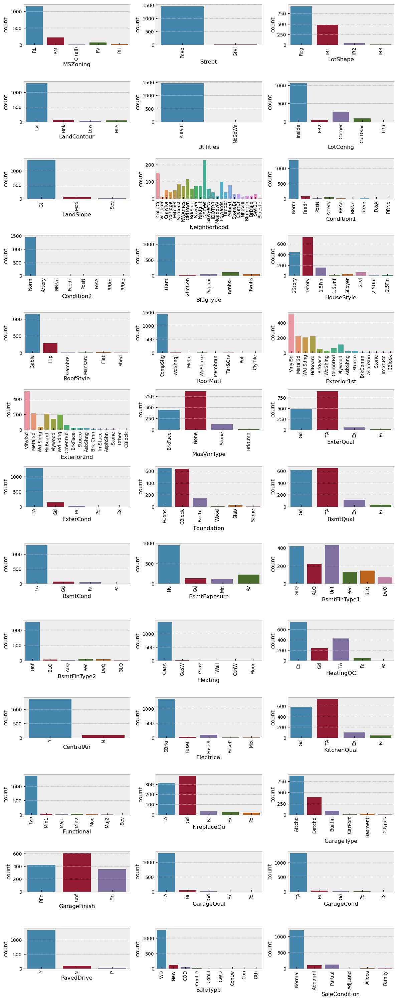

In [44]:
fig, ax = plt.subplots(13, 3, figsize = (12, 30))
for i, ax in enumerate(fig.axes):
    if i < len(category_df.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation = 90)
        sns.countplot(x = category_df.columns[i], data = category_df, ax = ax)

fig.tight_layout();

As we can see, there are many features where data points fall primarily under 1 column, for example `PavedDrive`, `GarageCond`, `GarageQual` and `Functional`. Features such as `Neighborhood` and `Exterior1st` may be more relevant as the data points are more evenly spread out among the categories.

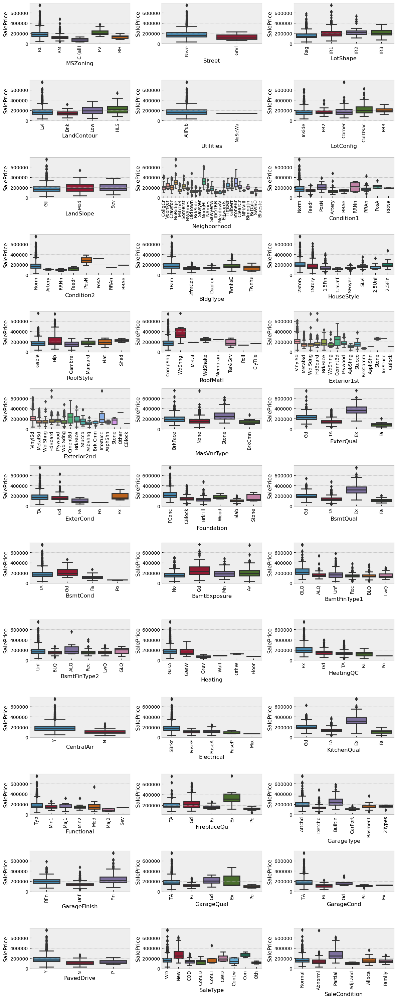

In [46]:
fig, ax = plt.subplots(13, 3, figsize = (12, 30))
for i, ax in enumerate(fig.axes):
    if i < len(category_df.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation = 90)
        sns.boxplot(x = category_df.columns[i], y = 'SalePrice', data = train_df, ax = ax)

fig.tight_layout();

For features with data points that are more widely spread out among the categories, we can see that certain categories stand out. For example, in `Neighborhood`, it seems that houses belonging to the neighborhood `NridgHt` or `Northridge Heights` tend to have a higher `SalePrice`.

# Data Processing

### 1. Imputing Missing Data

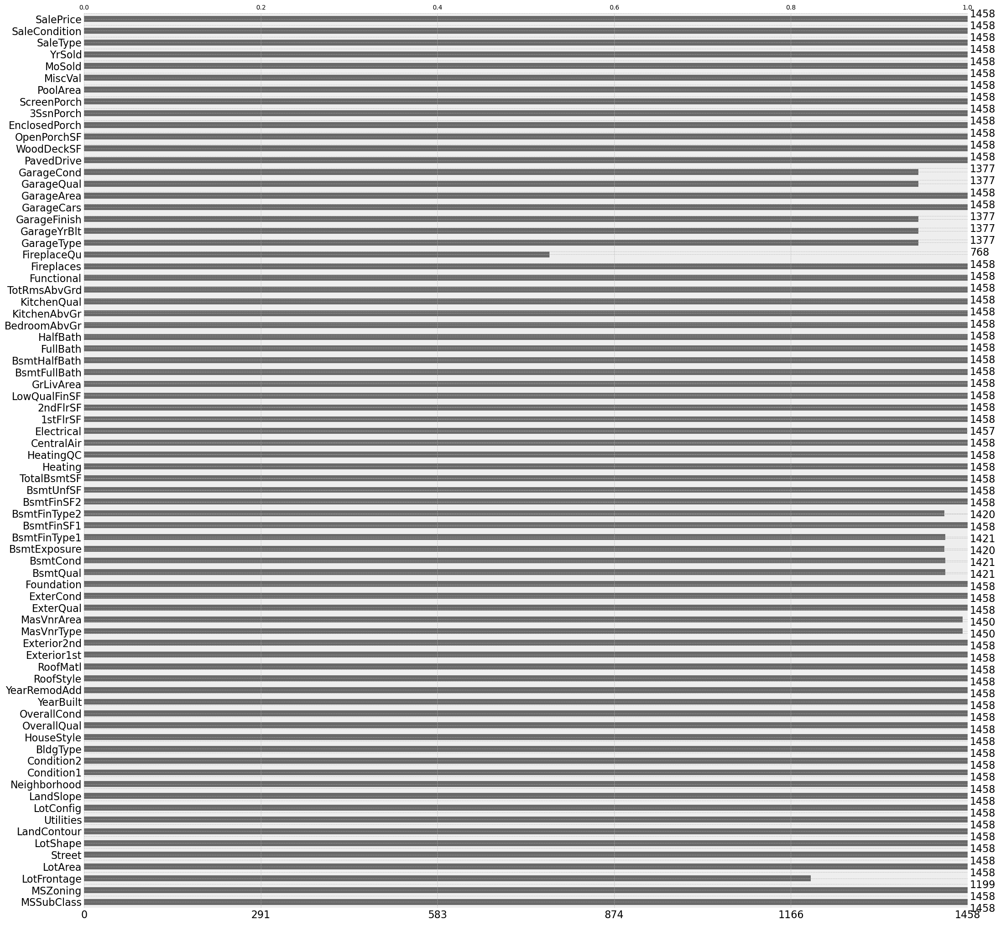

In [71]:
msno.bar(train_df);

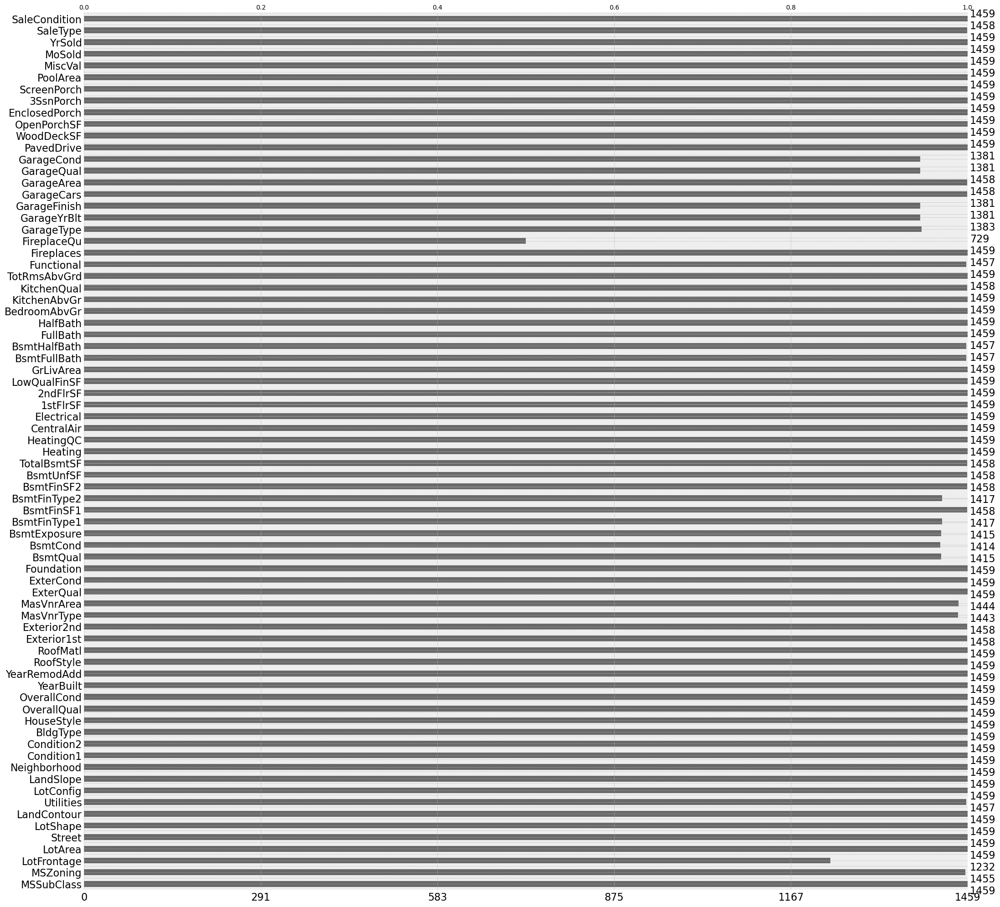

In [74]:
msno.bar(test_df);

Here, we can merge the two dataframes to perform imputation, processing and transformation on both concurrently.

In [80]:
merged_df = pd.concat([train_df, test_df], axis = 0)

In [82]:
merged_df.shape

(2917, 76)

In [85]:
percent_missing = merged_df.isnull().sum() * 100 / len(merged_df)
missing_value_df = pd.DataFrame({'column_name': merged_df.columns,
                                 'percent_missing': percent_missing})

missing_value_df.sort_values('percent_missing', ascending = False, inplace = True)

In [86]:
missing_value_df.query('percent_missing > 0')

,column_name,percent_missing
SalePrice,SalePrice,50.017141
FireplaceQu,FireplaceQu,48.680151
LotFrontage,LotFrontage,16.660953
GarageCond,GarageCond,5.450806
GarageYrBlt,GarageYrBlt,5.450806
GarageFinish,GarageFinish,5.450806
GarageQual,GarageQual,5.450806
GarageType,GarageType,5.382242
BsmtExposure,BsmtExposure,2.811107
BsmtCond,BsmtCond,2.811107


- We can treat missing entries first, then split the merged dataframe back into their training and testing dataset respectively.

In [89]:
merged_df['FireplaceQu'] = merged_df['FireplaceQu'].fillna('NA')

In [90]:
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    merged_df[col] = merged_df[col].fillna('NA')

- Missing values in Garage variables likely indicate 'No Garage', thus we can impute the numerical values as 0.

In [109]:
for col in ['GarageArea', 'GarageCars', 'GarageYrBlt']:
    merged_df[col] = merged_df[col].fillna(0)

In [91]:
for col in ['BsmtQual', 'BsmtExposure', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2']:
    merged_df[col] = merged_df[col].fillna('NA')

- Missing values in Basement variables likely indicate 'No Basement', thus we can impute the numerical values as 0.

In [107]:
for col in ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']:
    merged_df[col] = merged_df[col].fillna(0)

In [95]:
merged_df['MasVnrType'] = merged_df['MasVnrType'].fillna(merged_df['MasVnrType'].mode()[0])

In [96]:
merged_df['MSZoning'] = merged_df['MSZoning'].fillna(merged_df['MSZoning'].mode()[0])

In [97]:
merged_df['KitchenQual'] = merged_df['KitchenQual'].fillna(merged_df['KitchenQual'].mode()[0])

In [98]:
merged_df['Electrical'] = merged_df['Electrical'].fillna(merged_df['Electrical'].mode()[0])

In [99]:
merged_df['SaleType'] = merged_df['SaleType'].fillna(merged_df['SaleType'].mode()[0])

- As the `Utilities` column consists of only 1 'NoSeWa' value, we can safely remove this column instead of imputing missing entries.

In [105]:
merged_df = merged_df.drop(['Utilities'], axis = 1)

In [106]:
merged_df['Functional'] = merged_df['Functional'].fillna('Typ') # Typical Functionality

`LotFrontage` refers to the Linear feet of street connected to the property. This is likely linked to the Neighborhood each property resides in, therefore we can try grouping by `Neighborhood` and imputing with the median `LotFrontage` for each Neighborhood.

In [115]:
merged_df["LotFrontage"] = merged_df.groupby("Neighborhood")["LotFrontage"].transform(
    lambda x: x.fillna(x.median()))

Likewise, we can group by `MasVnrType` and obtain the median for each `MasVnrArea`.

In [121]:
merged_df["MasVnrArea"] = merged_df.groupby("MasVnrType")["MasVnrArea"].transform(
    lambda x: x.fillna(x.median()))

In [126]:
for col in ['Exterior1st', 'Exterior2nd']:
    merged_df[col] = merged_df[col].fillna(merged_df[col].mode()[0])    

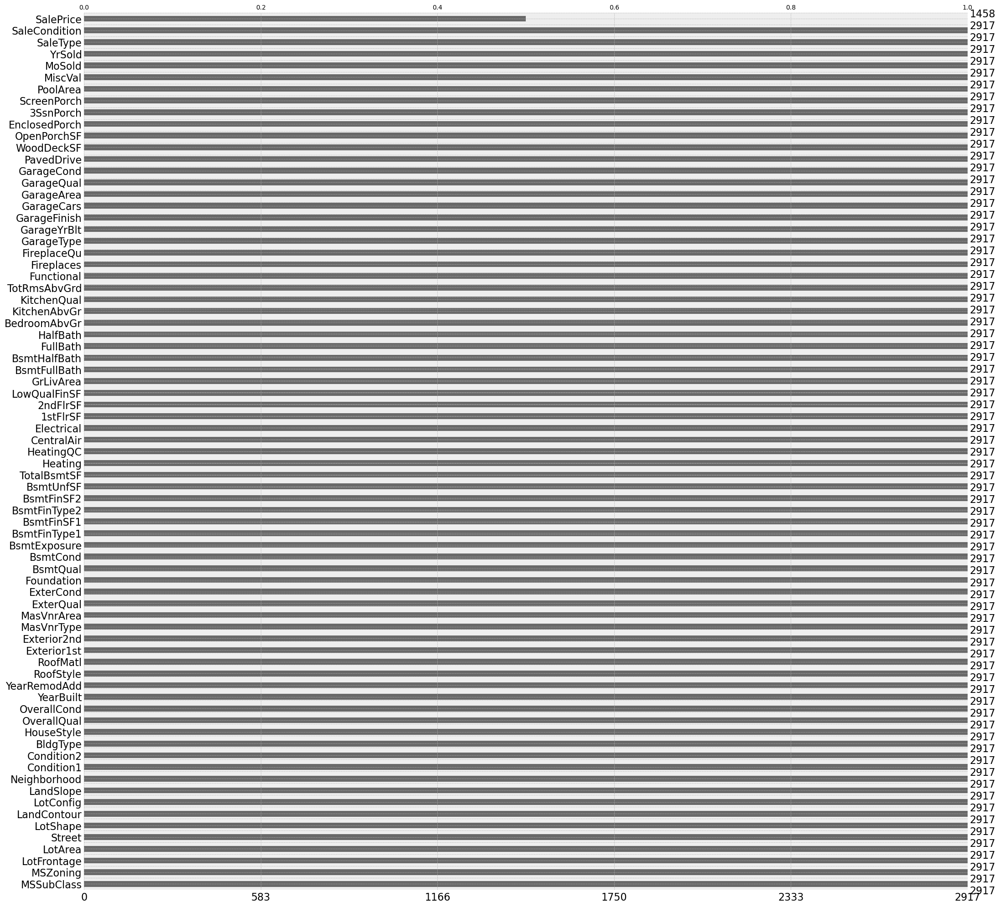

In [127]:
msno.bar(merged_df);

We are now done with imputation.

### 2. Converting Column Types

As discovered earlier in our analysis, we have a few numeric column types that should actually be categorical.

In [128]:
merged_df = merged_df.replace({"MSSubClass" : {20 : "MS20", 30 : "MS30", 40 : "MS40", 45 : "MS45", 
                                       50 : "MS50", 60 : "MS60", 70 : "MS70", 75 : "MS75", 
                                       80 : "MS80", 85 : "MS85", 90 : "MS90", 120 : "MS120", 
                                       150 : "MS150", 160 : "MS160", 180 : "MS180", 190 : "MS190"},
                       "MoSold" : {1 : "Jan", 2 : "Feb", 3 : "Mar", 4 : "Apr", 5 : "May", 6 : "Jun",
                                   7 : "Jul", 8 : "Aug", 9 : "Sep", 10 : "Oct", 11 : "Nov", 12 : "Dec"}
                      })

In [184]:
merged_df['YrSold'] = merged_df['YrSold'].astype(str)

Here, we can manually encode some categorical features that are ordinal, similar to our `OverallQual` and `OverallCond` variables.

In [152]:
merged_df = merged_df.replace({'LotShape': {'IR3': 1, 'IR2': 2, 'IR1': 3, 'Reg': 4},
'ExterQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'BsmtQual': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'BsmtCond': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'BsmtExposure': {'NA': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4},
'BsmtFinType1': {'NA': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
'BsmtFinType2': {'NA': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
'HeatingQC': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'CentralAir': {'N': 0, 'Y': 1},
'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'Functional': {'Sal': 0, 'Sev': 1, 'Maj2': 2, 'Maj1': 2, 'Mod': 3, 'Min2': 4, 'Min1': 4, 'Typ': 5},
'FireplaceQu': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'GarageFinish': {'NA': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
'GarageQual': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'GarageCond': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
'PavedDrive': {'N': 1, 'P': 2, 'Y': 3},
'PoolQC': {'NA': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}})

### 3. Feature Engineering

As we have discovered that the distribution of `SalePrice` is positively skewed, we can consider applying a log transformation to it.

In [191]:
merged_df['OverallGrade'] = merged_df['OverallQual'] * merged_df['OverallCond']

In [193]:
merged_df['OverallExter'] = merged_df['ExterQual'] * merged_df['ExterCond']

In [194]:
merged_df['OverallBsmt'] = merged_df['BsmtQual'] * merged_df['BsmtCond'] + merged_df['BsmtExposure']

In [195]:
merged_df['OverallGarage'] = merged_df['GarageQual'] * merged_df['GarageCond']

In [196]:
merged_df['NumBathrooms'] = merged_df['BsmtFullBath'] + merged_df['FullBath'] + 0.5 * merged_df['BsmtHalfBath'] + \
    0.5 * merged_df['HalfBath']

In [197]:
merged_df['TotalFloorSF'] = merged_df['1stFlrSF'] + merged_df['2ndFlrSF'] + 0.1 * merged_df['LowQualFinSF']

In [204]:
merged_df['OverallKitchen'] = merged_df['KitchenAbvGr'] * merged_df['KitchenQual'] 

In [205]:
merged_df['OverallFireplace'] = merged_df['Fireplaces'] * merged_df['FireplaceQu']

In [206]:
merged_df['TotalPorchSF'] = merged_df['OpenPorchSF'] + merged_df['EnclosedPorch'] + \
    merged_df['3SsnPorch'] + merged_df['ScreenPorch']

#### Splitting merged dataframe into training and testing dataset

In [327]:
merged_df = pd.get_dummies(merged_df)

In [328]:
train_df = merged_df[~merged_df['SalePrice'].isna()].copy()
test_df = merged_df[merged_df['SalePrice'].isna()].copy()

In [329]:
test_df = test_df.drop(['SalePrice'], axis = 1)

### 4. Transforming features

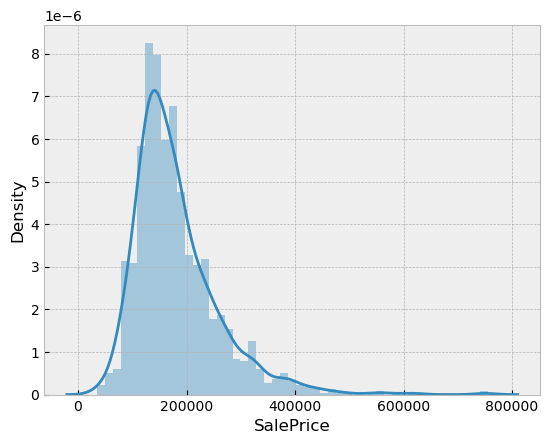

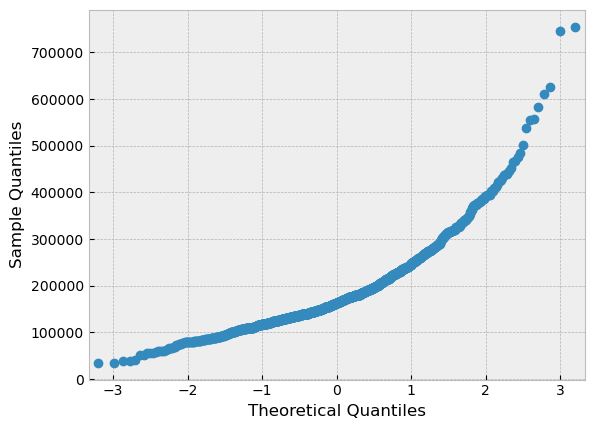

In [330]:
sns.distplot(train_df['SalePrice'])
fig = sm.qqplot(train_df['SalePrice'])

In [331]:
train_df['SalePrice'] = np.log1p(train_df['SalePrice'])

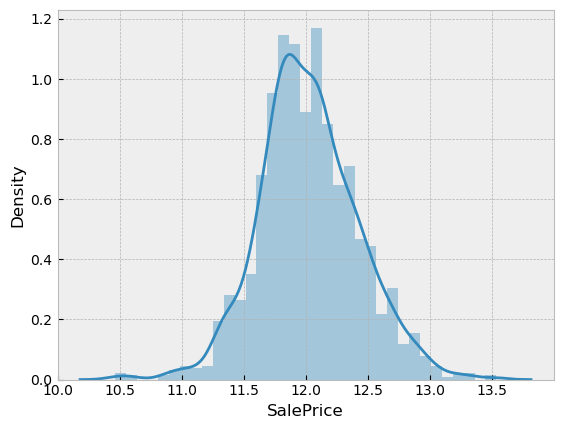

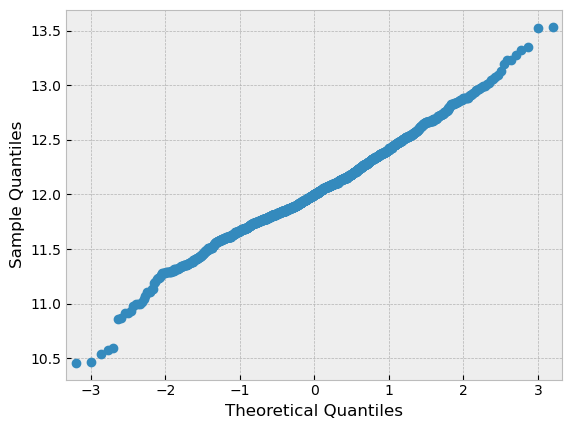

In [332]:
sns.distplot(train_df['SalePrice'])
fig = sm.qqplot(train_df['SalePrice'])

Now, `SalePrice` follows a normal distribution more closely.

Here, we can consider applying **log transformation** to skewed numerical features, therefore lessening impact of outliers given the presence of many outliers in the dataset.

- Credits to https://www.kaggle.com/code/juliencs/a-study-on-regression-applied-to-the-ames-dataset

In [333]:
num_columns = train_df.select_dtypes(include = ['int64', 'float64']).columns

In [334]:
skewness = train_df[num_columns].apply(lambda x: stats.skew(x))
skewness = skewness[abs(skewness) > 0.5] # moderately skewed
skewed_features = skewness.index
train_df[skewed_features] = np.log1p(train_df[skewed_features])

In [335]:
test_df[skewed_features] = np.log1p(test_df[skewed_features])

In [336]:
num_columns = num_columns.drop('SalePrice')

Here, we can split the training dataset further into a training dataset and a validation set, as we do not have labels for the testing dataset. Then, we can test the predictive capability of our models on the validation set.

In [337]:
y = train_df['SalePrice']

In [338]:
new_train_df = train_df.drop('SalePrice', axis = 1)

In [339]:
x_train, x_test, y_train, y_test = train_test_split(new_train_df, y, test_size = 0.3, random_state = 42)

In [340]:
x_train.shape

(1020, 253)

In [341]:
robustSclr = RobustScaler()
x_train[num_columns] = robustSclr.fit_transform(x_train[num_columns])

In [342]:
x_test[num_columns] = robustSclr.transform(x_test[num_columns])

In [343]:
robustSclr2 = RobustScaler()
train_df[['SalePrice']] = robustSclr2.fit_transform(train_df[['SalePrice']])

In [344]:
scorer = make_scorer(mean_squared_error, greater_is_better = False)

def rmse_train(model):
    rmse = np.sqrt(-cross_val_score(model, x_train, y_train, scoring = scorer, cv = 5))
    return rmse

def rmse_test(model):
    rmse = np.sqrt(-cross_val_score(model, x_test, y_test, scoring = scorer, cv = 5))
    return rmse

#### Simple Linear Regression

In [345]:
lin_reg = LinearRegression()
lin_reg.fit(x_train, y_train)

LinearRegression()

In [347]:
print('Training RMSE: ', rmse_train(lin_reg).mean())
print('Testing RMSE: ', rmse_test(lin_reg).mean())

y_train_pred_lr = lin_reg.predict(x_train)
y_test_pred_lr = lin_reg.predict(x_test)

Training RMSE:  0.13250195281249227
Testing RMSE:  0.24429705439477772


Credits to : https://www.kaggle.com/code/juliencs/a-study-on-regression-applied-to-the-ames-dataset

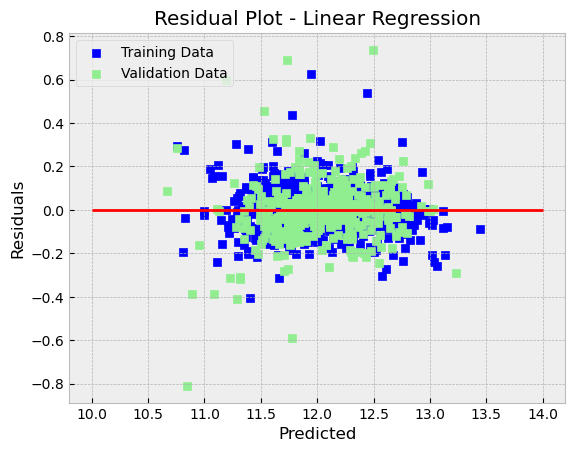

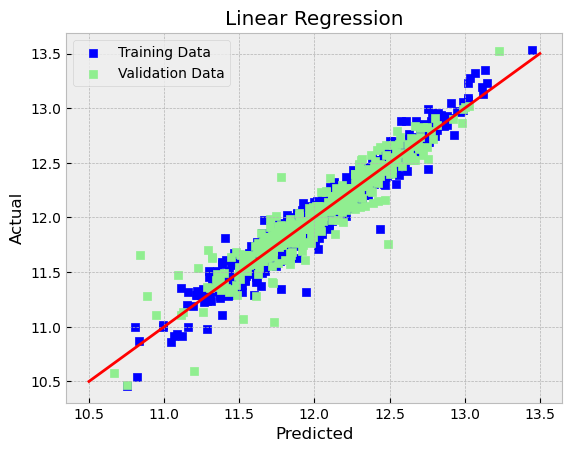

In [358]:
plt.scatter(y_train_pred_lr, y_train_pred_lr - y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_lr, y_test_pred_lr - y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Residual Plot - Linear Regression')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = 10, xmax = 14, color = 'red')
plt.show();

plt.scatter(y_train_pred_lr, y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_lr, y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Linear Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.legend(loc = 'upper left')
plt.plot([10.5, 13.5], [10.5, 13.5], c = 'red')
plt.show();

**Given the issues of multicollinearity, we should introduce Regularization.**
- First, we can try using L1 Regularization with Lasso Regression.
- With Regularization, instead of only minimizing the sum of squared residuals, we add a penalty term.
- Lasso Regression allows us to shrink the coefficient of certain variables to 0, that is, we exclude them completely from our model. This may be particularly useful given the large number of variables, of which many may not be relevant at all.
- Here, Lasso Regression introduces the penalty term ( Lambda * Absolute sum of coefficients ) to the error function.

In [364]:
lasso_reg = LassoCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10], cv = 10, random_state = 42)
lasso_reg.fit(x_train, y_train)

LassoCV(alphas=[0.0001, 0.001, 0.01, 0.1, 1, 10], cv=10, random_state=42)

In [365]:
print('Lasso Regression Training RMSE: ', rmse_train(lasso_reg).mean())
print('Lasso Regression Testing RMSE: ', rmse_test(lasso_reg).mean())

y_train_pred_lasso = lasso_reg.predict(x_train)
y_test_pred_lasso = lasso_reg.predict(x_test)

Lasso Regression Training RMSE:  0.11817455035676579
Lasso Regression Testing RMSE:  0.12324928419426211


Here, we can observe that the RMSE on the testing dataset falls considerably, as compared to the simple linear regression without regularization.

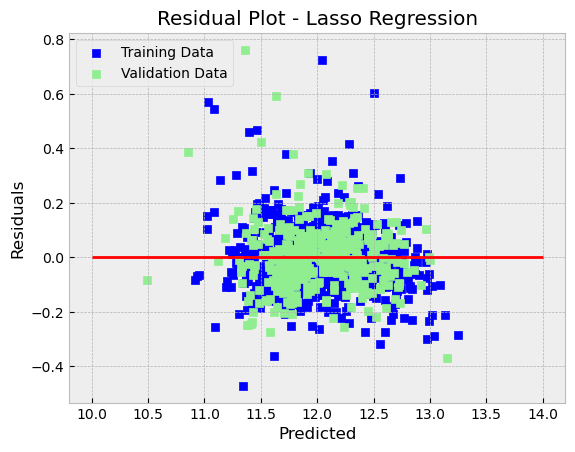

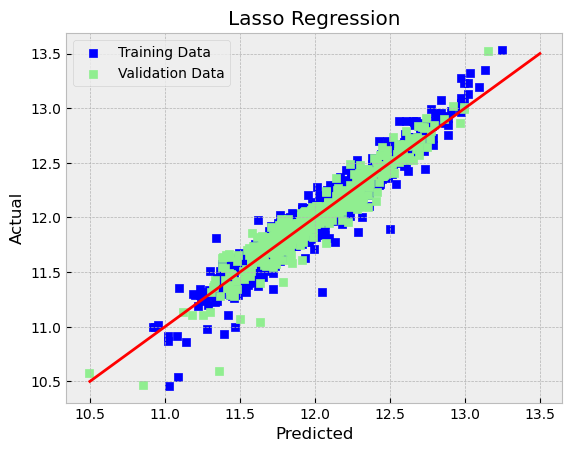

In [366]:
plt.scatter(y_train_pred_lasso, y_train_pred_lasso - y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_lasso, y_test_pred_lasso - y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Residual Plot - Lasso Regression')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = 10, xmax = 14, color = 'red')
plt.show();

plt.scatter(y_train_pred_lasso, y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_lasso, y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Lasso Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.legend(loc = 'upper left')
plt.plot([10.5, 13.5], [10.5, 13.5], c = 'red')
plt.show();

Credits to https://www.kaggle.com/code/apapiu/regularized-linear-models, where I learnt how to plot Lasso Model coefficients from.

In [367]:
coef = pd.Series(lasso_reg.coef_, index = x_train.columns)

In [375]:
print('Number of features eliminated:', str(sum(coef == 0)) + ' variables')

Number of features eliminated: 177 variables


In [377]:
imp_coef = pd.concat([coef.sort_values().head(10),
                    coef.sort_values().tail(10)])

Text(0.5, 1.0, 'Feature Importance: Lasso Model Coefficients')

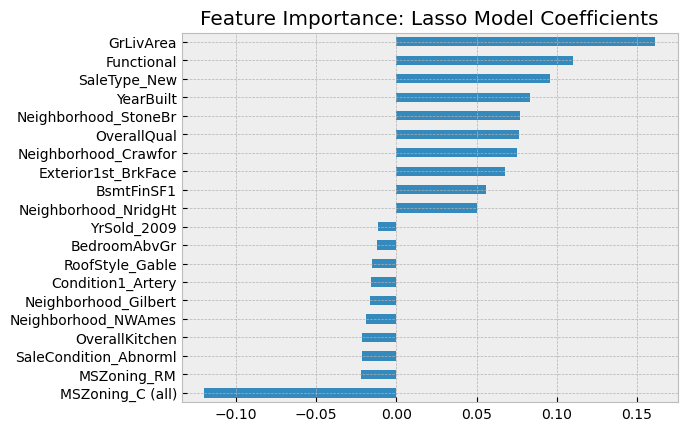

In [379]:
imp_coef.plot(kind = 'barh')
plt.title('Feature Importance: Lasso Model Coefficients')

**Now, we can repeat the same thing, but with Ridge Regression instead.**
- Ridge Regression introduces L2 Regularization (Lasso uses L1 Regularization), whereby the penalty term is the square of the magnitude of the coefficients. This means that coefficients can get asymptomatically close to zero, but can never reach zero like in the case of Lasso Regression.

In [382]:
ridge_reg = RidgeCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10], cv = 10)
ridge_reg.fit(x_train, y_train)

RidgeCV(alphas=[0.0001, 0.001, 0.01, 0.1, 1, 10], cv=10)

In [383]:
print('Ridge Regression Training RMSE: ', rmse_train(ridge_reg).mean())
print('Ridge Regression Testing RMSE: ', rmse_test(ridge_reg).mean())

y_train_pred_ridge = ridge_reg.predict(x_train)
y_test_pred_ridge = ridge_reg.predict(x_test)

Ridge Regression Training RMSE:  0.11706567717588678
Ridge Regression Testing RMSE:  0.12940685287825998


The Ridge Regression performs slightly worse on the testing dataset as compared to the Lasso Regression model.

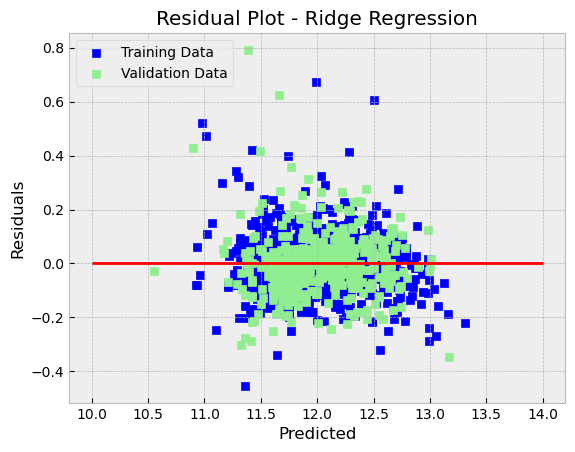

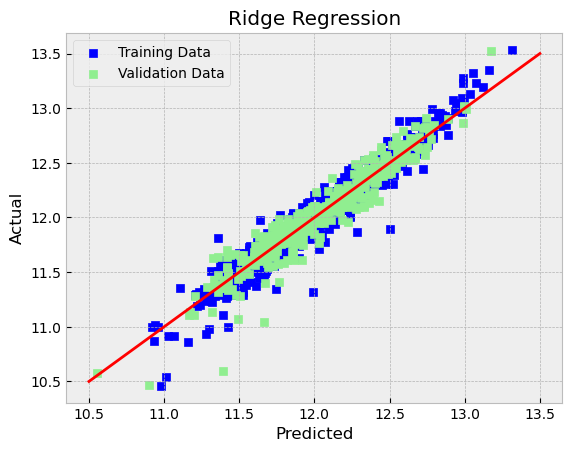

In [384]:
plt.scatter(y_train_pred_ridge, y_train_pred_ridge - y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_ridge, y_test_pred_ridge - y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Residual Plot - Ridge Regression')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = 10, xmax = 14, color = 'red')
plt.show();

plt.scatter(y_train_pred_ridge, y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_ridge, y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Ridge Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.legend(loc = 'upper left')
plt.plot([10.5, 13.5], [10.5, 13.5], c = 'red')
plt.show();

We can also incorporate both L1 and L2 Regularization with ElasticNet Regression. This introduces both the Lasso Regression penalty term and the Ridge Regression penalty term to the error function.

In [387]:
enet_reg = ElasticNetCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10], cv = 10, random_state = 42)
enet_reg.fit(x_train, y_train)

ElasticNetCV(alphas=[0.0001, 0.001, 0.01, 0.1, 1, 10], cv=10, random_state=42)

In [388]:
print('ElasticNet Regression Training RMSE: ', rmse_train(enet_reg).mean())
print('ElasticNet Regression Testing RMSE: ', rmse_test(enet_reg).mean())

y_train_pred_enet = enet_reg.predict(x_train)
y_test_pred_enet = enet_reg.predict(x_test)

ElasticNet Regression Training RMSE:  0.11635641493855017
ElasticNet Regression Testing RMSE:  0.1265814379236261


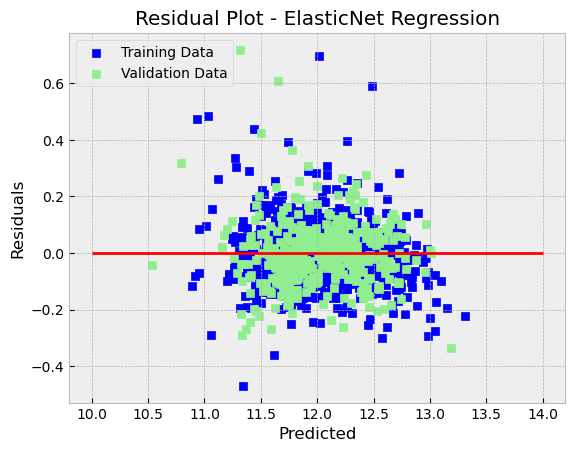

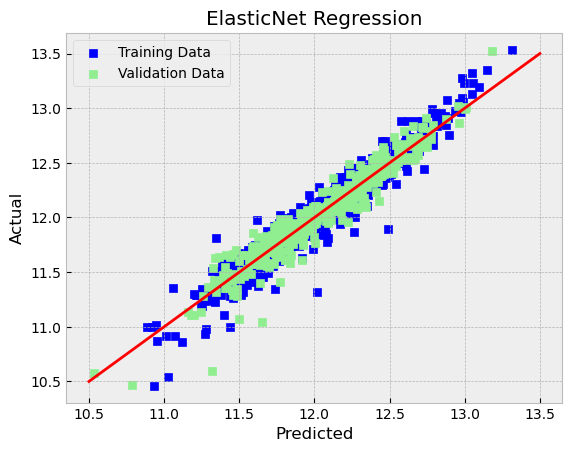

In [389]:
plt.scatter(y_train_pred_enet, y_train_pred_enet - y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_enet, y_test_pred_enet - y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Residual Plot - ElasticNet Regression')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = 10, xmax = 14, color = 'red')
plt.show();

plt.scatter(y_train_pred_enet, y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_enet, y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('ElasticNet Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.legend(loc = 'upper left')
plt.plot([10.5, 13.5], [10.5, 13.5], c = 'red')
plt.show();

We can also implement a Random Forest Regressor, an ensemble learning method based on decision trees.
- A large number of decision trees are created, each trained on a different subset of the training data and wth a random selection of features. The final prediction is then made by averaging the predictions of all the trees.
- The GINI inequality index measures the inequality of variable importance across the individual decision trees in a random forest, which is computed via the decrease in impurity that results from splitting the data on taht feature.

In [395]:
rf_reg = RandomForestRegressor(n_estimators = 1000)
rf_reg.fit(x_train, y_train)

RandomForestRegressor(n_estimators=1000)

In [396]:
print('Random Forest Regression Training RMSE: ', rmse_train(rf_reg).mean())
print('Random Forest Regression Testing RMSE: ', rmse_test(rf_reg).mean())

y_train_pred_rf = rf_reg.predict(x_train)
y_test_pred_rf = rf_reg.predict(x_test)

Random Forest Regression Training RMSE:  0.13807487397335066
Random Forest Regression Testing RMSE:  0.15491057471723527


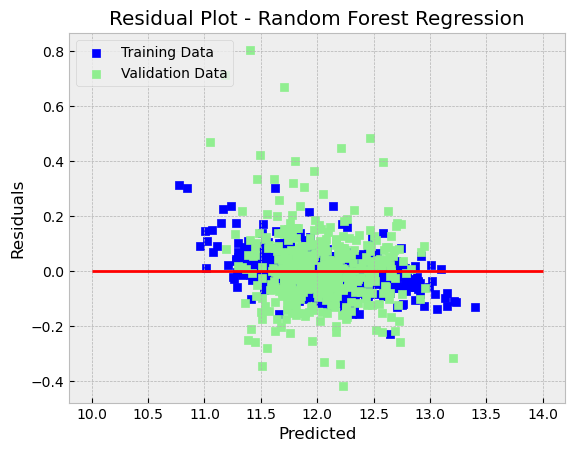

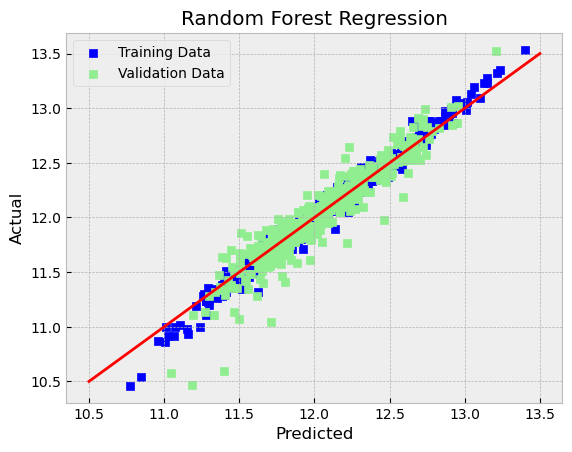

In [397]:
plt.scatter(y_train_pred_rf, y_train_pred_rf - y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_rf, y_test_pred_rf - y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Residual Plot - Random Forest Regression')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = 10, xmax = 14, color = 'red')
plt.show();

plt.scatter(y_train_pred_rf, y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_rf, y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Random Forest Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.legend(loc = 'upper left')
plt.plot([10.5, 13.5], [10.5, 13.5], c = 'red')
plt.show();

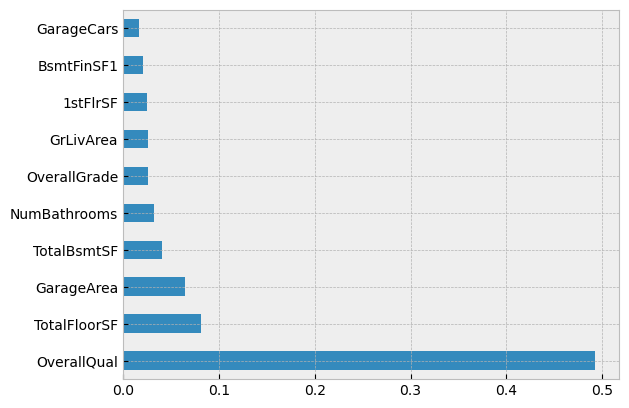

In [405]:
feat_importances = pd.Series(rf_reg.feature_importances_, index = x_test.columns)
feat_importances.nlargest(10).plot(kind = 'barh');

We can also implement an XGBoost model, another ensemble method that uses a combination of decision trees.
- XGBoost uses gradient boosting to combine multiple decision trees into a strong predictive model. Gradient boosting is a technique that involves sequentially adding decision trees to the model, where each subsequent tree is trained to correct the errors of the previous tree. In other words, each tree tries to capture the patterns in the data that were missed by the previous tree, leading to a more accurate prediction.
- To prevent overfitting and improve generalization, XGBoost uses regularization techniques such as L1 and L2 regularization. L1 regularization adds a penalty term to the loss function that is proportional to the absolute value of the weights, while L2 regularization adds a penalty term that is proportional to the square of the weights.

In [406]:
dtrain = xgb.DMatrix(x_train, label = y_train)
dtest = xgb.DMatrix(x_test)

In [407]:
xgb_reg = xgb.XGBRegressor(n_estimators = 360, max_depth = 2, learning_rate = 0.1)
xgb_reg.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=360, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [408]:
print('XGBoost Regression Training RMSE: ', rmse_train(xgb_reg).mean())
print('XGBoost Regression Testing RMSE: ', rmse_test(xgb_reg).mean())

y_train_pred_xgb = xgb_reg.predict(x_train)
y_test_pred_xgb = xgb_reg.predict(x_test)

XGBoost Regression Training RMSE:  0.1216451540746529
XGBoost Regression Testing RMSE:  0.1279708315100608


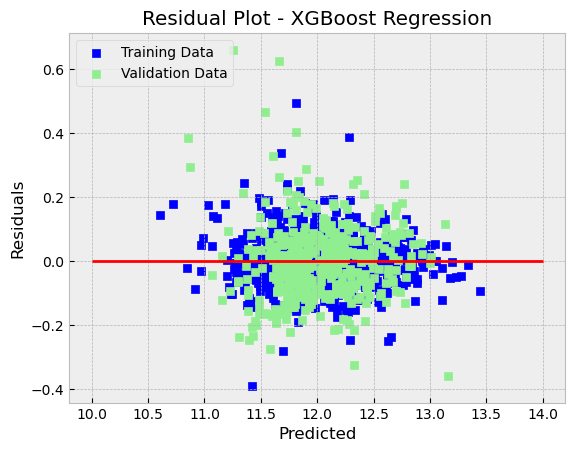

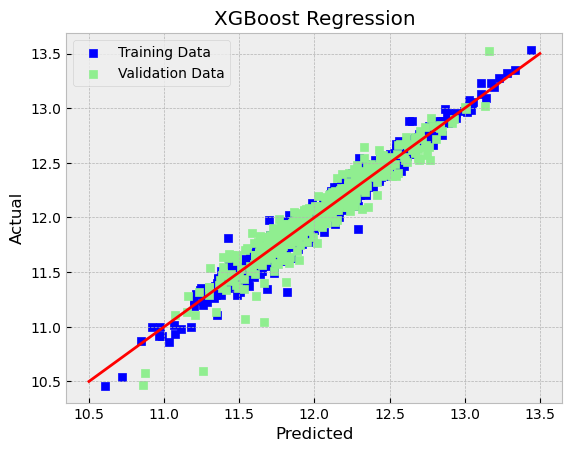

In [409]:
plt.scatter(y_train_pred_xgb, y_train_pred_xgb - y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_xgb, y_test_pred_xgb - y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('Residual Plot - XGBoost Regression')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = 10, xmax = 14, color = 'red')
plt.show();

plt.scatter(y_train_pred_xgb, y_train, c = 'blue', marker = 's', label = 'Training Data')
plt.scatter(y_test_pred_xgb, y_test, c = 'lightgreen', marker = 's', label = 'Validation Data')
plt.title('XGBoost Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.legend(loc = 'upper left')
plt.plot([10.5, 13.5], [10.5, 13.5], c = 'red')
plt.show();